CIND 820- Big Data Analytics Project

Using Machine Learning for Prediction of Early Readmission of Diabetic Patients

Supervised by: Ceni Babaoglu

Presented by: Nehal Gamal Mohamed (501278190)


In [ ]:
!pip install pandas
import sys
!{sys.executable} -m pip install -U pandas-profiling
!jupyter nbextension enable --py widgetsnbextension
!pip install matplotlib
!pip install graphviz

  Using cached pandas_profiling-3.6.6-py2.py3-none-any.whl (324 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 26.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=545e6d18eaa6b9a18faf890428aab505d70135df2158336ed321617327a4b698
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
Enabling notebook extension jupyter-js-widgets/extension...
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json
Paths used for configuration of notebook: 
    	
      - Validating: OK
Paths used for configuration of notebook: 
    	/root/.

In [ ]:
#importing necessary libraries
import csv
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


In [ ]:
#Uploading diabetic_data csv file
from google.colab import files
data = files.upload()
#Instintiating DataReader class
class DataReader:
    def read_csv(self, filename):
        df = pd.read_csv(filename)
        return df

filename = next(iter(data))
data_reader = DataReader()
df = data_reader.read_csv(filename)
#Displaying the first 10 records of the dataset
print(df.head(10))


Saving diabetic_data (version 1).csv to diabetic_data (version 1).csv
   encounter_id  patient_nbr             race  gender       age weight  \
0       2278392      8222157        Caucasian  Female    [0-10)      ?   
1        149190     55629189        Caucasian  Female   [10-20)      ?   
2         64410     86047875  AfricanAmerican  Female   [20-30)      ?   
3        500364     82442376        Caucasian    Male   [30-40)      ?   
4         16680     42519267        Caucasian    Male   [40-50)      ?   
5         35754     82637451        Caucasian    Male   [50-60)      ?   
6         55842     84259809        Caucasian    Male   [60-70)      ?   
7         63768    114882984        Caucasian    Male   [70-80)      ?   
8         12522     48330783        Caucasian  Female   [80-90)      ?   
9         15738     63555939        Caucasian  Female  [90-100)      ?   

   admission_type_id  discharge_disposition_id  admission_source_id  \
0                  6                        

In [ ]:
#Displaying variables data types
print("Dataset Information:")
print(df.info())

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-n

In [ ]:
#Defining lists for categorical variables and numeric variables
categorical_columns = [
    'race',
    'gender',
    'age',
    'weight',
    'payer_code',
    'medical_specialty',
    'diag_1',
    'diag_2',
    'diag_3',
    'max_glu_serum',
    'A1Cresult',
    'metformin',
    'repaglinide',
    'nateglinide',
    'chlorpropamide',
    'glimepiride',
    'acetohexamide',
    'glipizide',
    'glyburide',
    'tolbutamide',
    'pioglitazone',
    'rosiglitazone',
    'acarbose',
    'miglitol',
    'troglitazone',
    'tolazamide',
    'examide',
    'citoglipton',
    'insulin',
    'glyburide-metformin',
    'glipizide-metformin',
    'glimepiride-pioglitazone',
    'metformin-rosiglitazone',
    'metformin-pioglitazone',
    'change',
    'diabetesMed',
    'readmitted'
]

numeric_columns = [
    'encounter_id',
    'patient_nbr',
    'admission_type_id',
    'discharge_disposition_id',
    'admission_source_id',
    'time_in_hospital',
    'num_lab_procedures',
    'num_procedures',
    'num_medications',
    'number_outpatient',
    'number_emergency',
    'number_inpatient',
    'number_diagnoses'
]


In [ ]:
# Define mappings according to the IDS_mapping file
admission_type_mapping = {
    1: 'Emergency',
    2: 'Urgent',
    3: 'Elective',
    4: 'Newborn',
    5: 'Not Available',
    6: 'NULL',
    7: 'Trauma Center',
    8: 'Not Mapped'
}

discharge_disposition_mapping = {
    1: 'Discharged to home',
    2: 'Discharged/transferred to another short term hospital',
    3: 'Discharged/transferred to SNF',
    4: 'Discharged/transferred to ICF',
    5: 'Discharged/transferred to another type of inpatient care institution',
    6: 'Discharged/transferred to home with home health service',
    7: 'Left AMA',
    8: 'Discharged/transferred to home under care of Home IV provider',
    9: 'Admitted as an inpatient to this hospital',
    10: 'Neonate discharged to another hospital for neonatal aftercare',
    11: 'Expired',
    12: 'Still patient or expected to return for outpatient services',
    13: 'Hospice / home',
    14: 'Hospice / medical facility',
    15: 'Discharged/transferred within this institution to Medicare approved swing bed',
    16: 'Discharged/transferred/referred another institution for outpatient services',
    17: 'Discharged/transferred/referred to this institution for outpatient services',
    18: 'NULL',
    19: 'Expired at home. Medicaid only, hospice.',
    20: 'Expired in a medical facility. Medicaid only, hospice.',
    21: 'Expired, place unknown. Medicaid only, hospice.',
    22: 'Discharged/transferred to another rehab fac including rehab units of a hospital.',
    23: 'Discharged/transferred to a long term care hospital.',
    24: 'Discharged/transferred to a nursing facility certified under Medicaid but not certified under Medicare.',
    25: 'Not Mapped',
    26: 'Unknown/Invalid',
    27: 'Discharged/transferred to a federal health care facility.',
    28: 'Discharged/transferred/referred to a psychiatric hospital of psychiatric distinct part unit of a hospital',
    29: 'Discharged/transferred to a Critical Access Hospital (CAH)',
    30: 'Discharged/transferred to another Type of Health Care Institution not Defined Elsewhere'
}

admission_source_mapping = {
    1: 'Physician Referral',
    2: 'Clinic Referral',
    3: 'HMO Referral',
    4: 'Transfer from a hospital',
    5: 'Transfer from a Skilled Nursing Facility (SNF)',
    6: 'Transfer from another health care facility',
    7: 'Emergency Room',
    8: 'Court/Law Enforcement',
    9: 'Not Available',
    10: 'Transfer from critical access hospital',
    11: 'Normal Delivery',
    12: 'Premature Delivery',
    13: 'Sick Baby',
    14: 'Extramural Birth',
    15: 'Not Available',
    17: 'NULL',
    18: 'Transfer From Another Home Health Agency',
    19: 'Readmission to Same Home Health Agency',
    20: 'Not Mapped',
    21: 'Unknown/Invalid',
    22: 'Transfer from hospital inpt/same fac reslt in a sep claim',
    23: 'Born inside this hospital',
    24: 'Born outside this hospital',
    25: 'Transfer from Ambulatory Surgery Center',
    26: 'Transfer from Hospice'
}

# Create temporary columns for display purposes
df_copy = df.copy()
df_copy['admission_type'] = df_copy['admission_type_id'].map(admission_type_mapping)
df_copy['discharge_disposition'] = df_copy['discharge_disposition_id'].map(discharge_disposition_mapping)
df_copy['admission_source'] = df_copy['admission_source_id'].map(admission_source_mapping)

# Display the first 10 records after mapping
print(df_copy[['admission_type', 'discharge_disposition', 'admission_source']].head())



  admission_type discharge_disposition    admission_source
0           NULL            Not Mapped  Physician Referral
1      Emergency    Discharged to home      Emergency Room
2      Emergency    Discharged to home      Emergency Room
3      Emergency    Discharged to home      Emergency Room
4      Emergency    Discharged to home      Emergency Room


In [ ]:
#Dataset Description
print("Dataset Description:")
print(df.describe(include='all'))

Dataset Description:
        encounter_id   patient_nbr       race  gender      age  weight  \
count   1.017660e+05  1.017660e+05     101766  101766   101766  101766   
unique           NaN           NaN          6       3       10      10   
top              NaN           NaN  Caucasian  Female  [70-80)       ?   
freq             NaN           NaN      76099   54708    26068   98569   
mean    1.652016e+08  5.433040e+07        NaN     NaN      NaN     NaN   
std     1.026403e+08  3.869636e+07        NaN     NaN      NaN     NaN   
min     1.252200e+04  1.350000e+02        NaN     NaN      NaN     NaN   
25%     8.496119e+07  2.341322e+07        NaN     NaN      NaN     NaN   
50%     1.523890e+08  4.550514e+07        NaN     NaN      NaN     NaN   
75%     2.302709e+08  8.754595e+07        NaN     NaN      NaN     NaN   
max     4.438672e+08  1.895026e+08        NaN     NaN      NaN     NaN   

        admission_type_id  discharge_disposition_id  admission_source_id  \
count       10

In [ ]:
#Converted blank and "?" to NaN to represent missing values
# Replace '?' and blank cells with NaN
df.replace({'?': pd.NA, '': pd.NA}, inplace=True)

# Replaced 'None' in 'max_glu_serum' and 'A1Cresult' to be seen as 'No Test' category and not as missing values
df['max_glu_serum'].replace({pd.NA: 'No Test', 'None': 'No Test'}, inplace=True)
df['A1Cresult'].replace({pd.NA: 'No Test', 'None': 'No Test'}, inplace=True)
missing_values = df.isna().sum()
print("Number of missing values in each column:")
print(missing_values)

Number of missing values in each column:
encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepi

In [ ]:
#Handling missing values in categorical columns by adding "Missing" as subcategory
for col in categorical_columns:
    df[col].fillna('Missing', inplace=True)
print(df[categorical_columns].isnull().sum())



race                        0
gender                      0
age                         0
weight                      0
payer_code                  0
medical_specialty           0
diag_1                      0
diag_2                      0
diag_3                      0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazone                0
rosiglitazone               0
acarbose                    0
miglitol                    0
troglitazone                0
tolazamide                  0
examide                     0
citoglipton                 0
insulin                     0
glyburide-metformin         0
glipizide-metformin         0
glimepiride-pioglitazone    0
metformin-rosiglitazone     0
metformin-

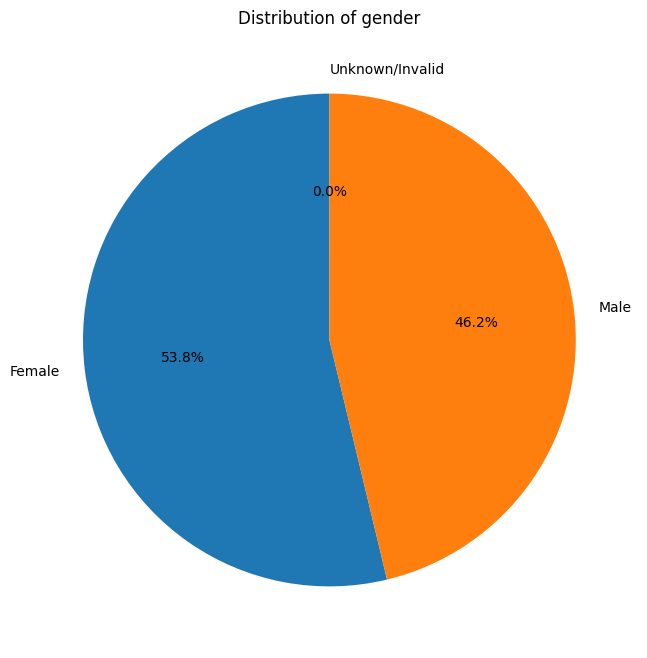

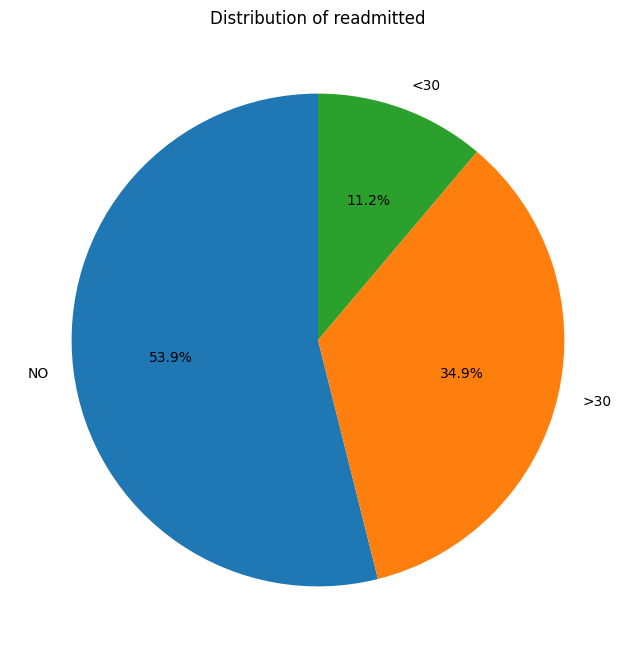

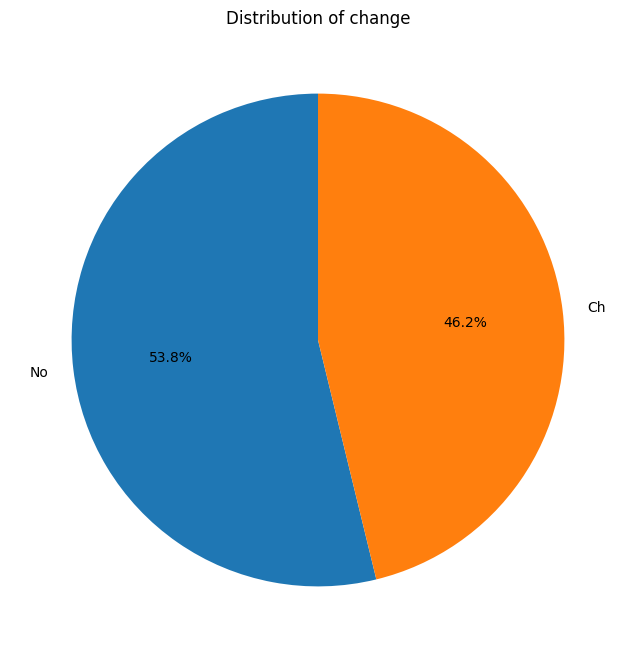

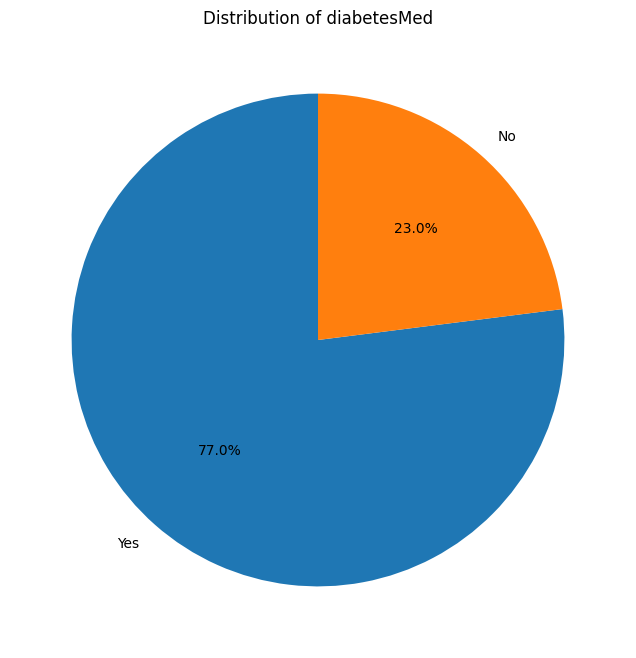

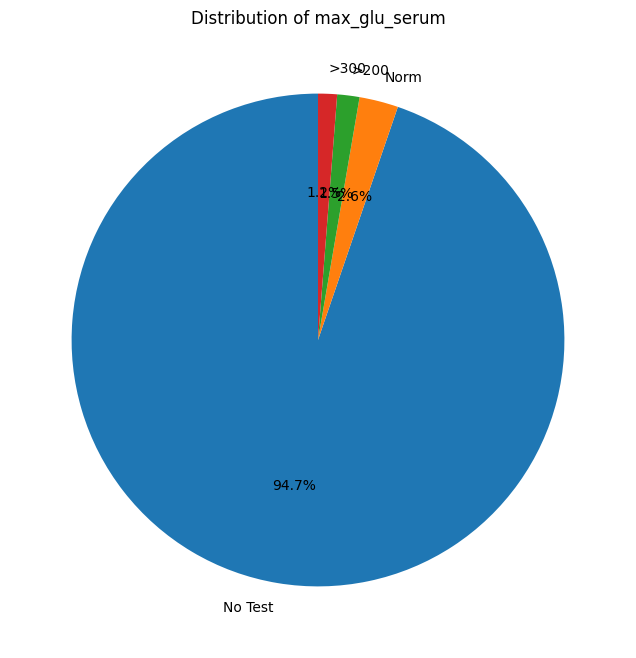

...

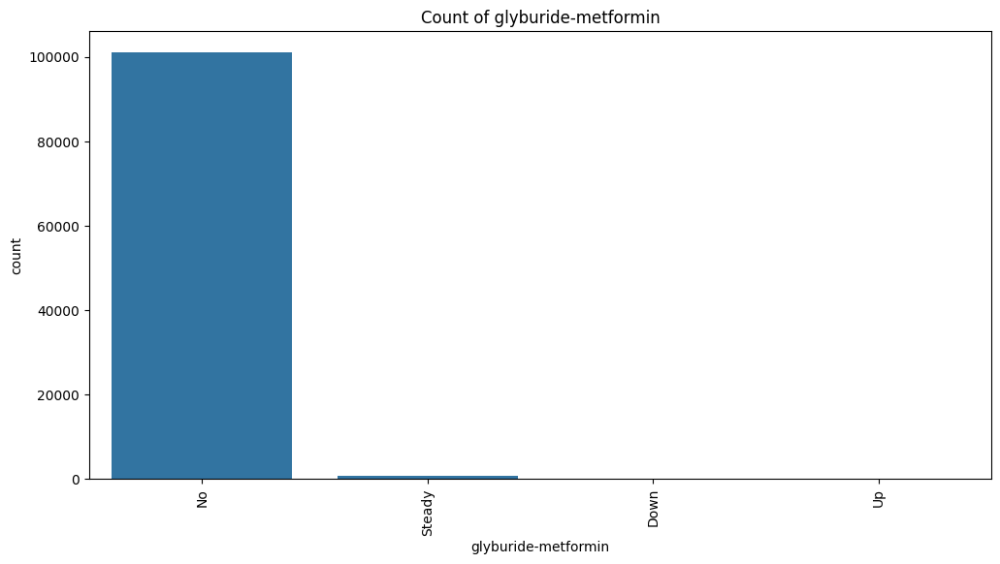

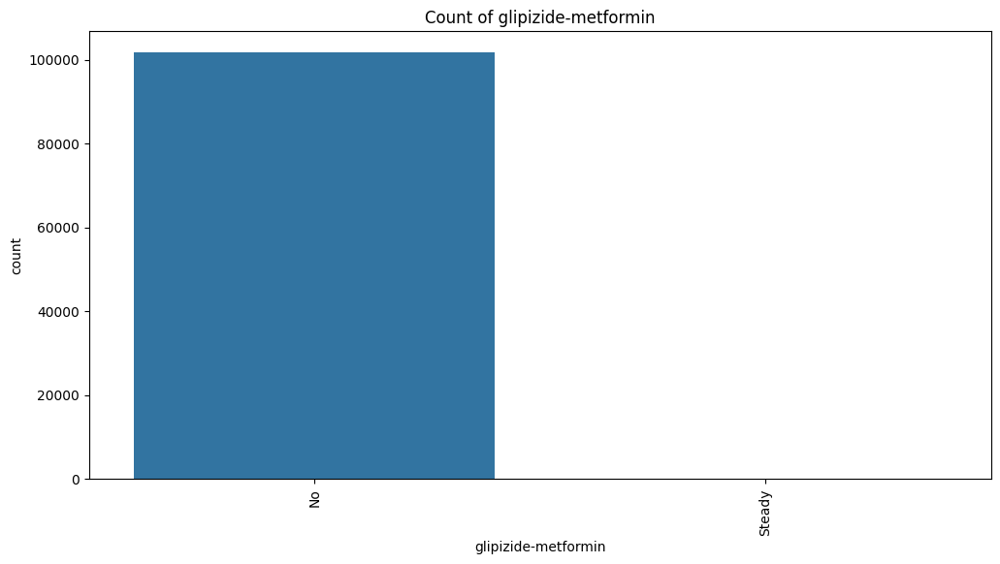

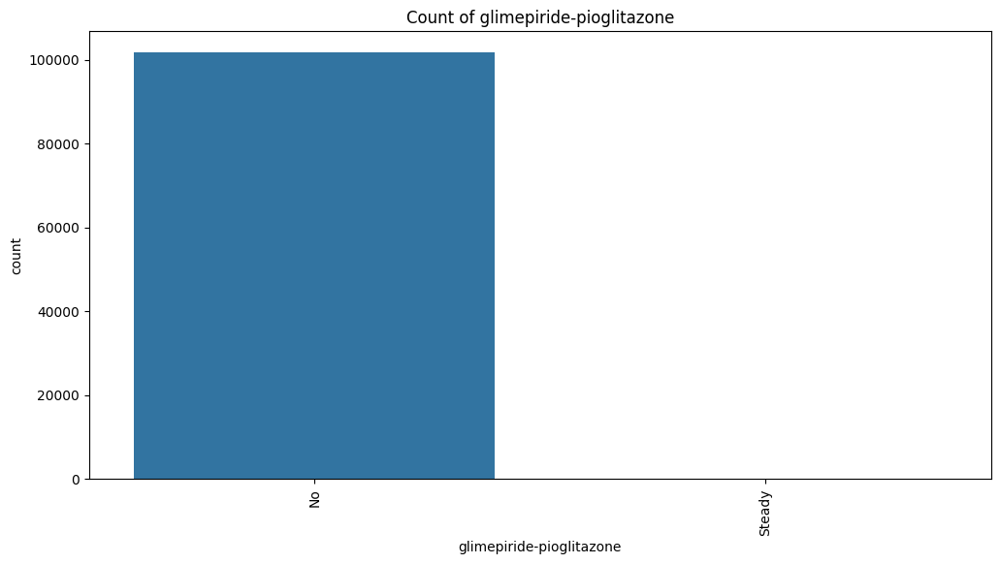

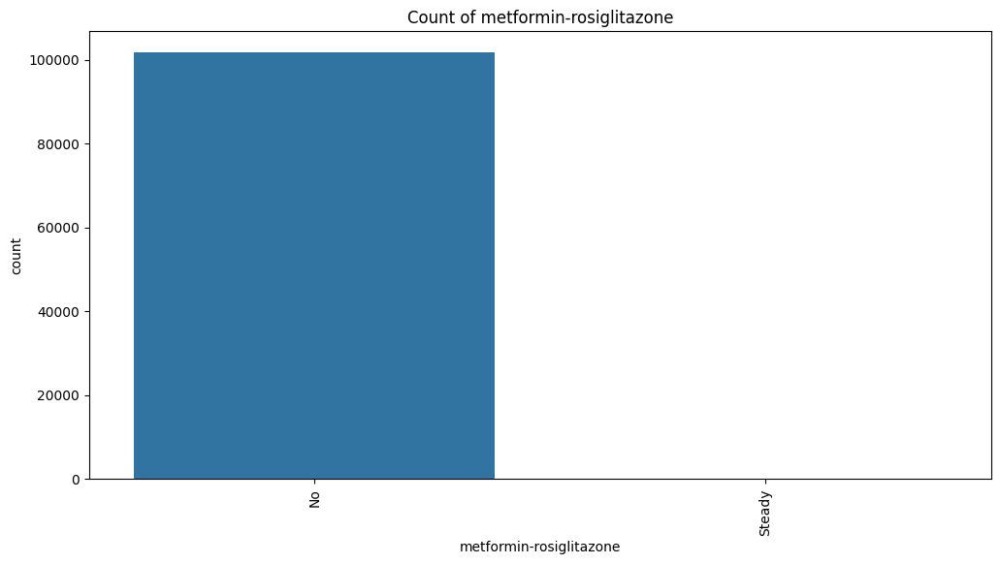

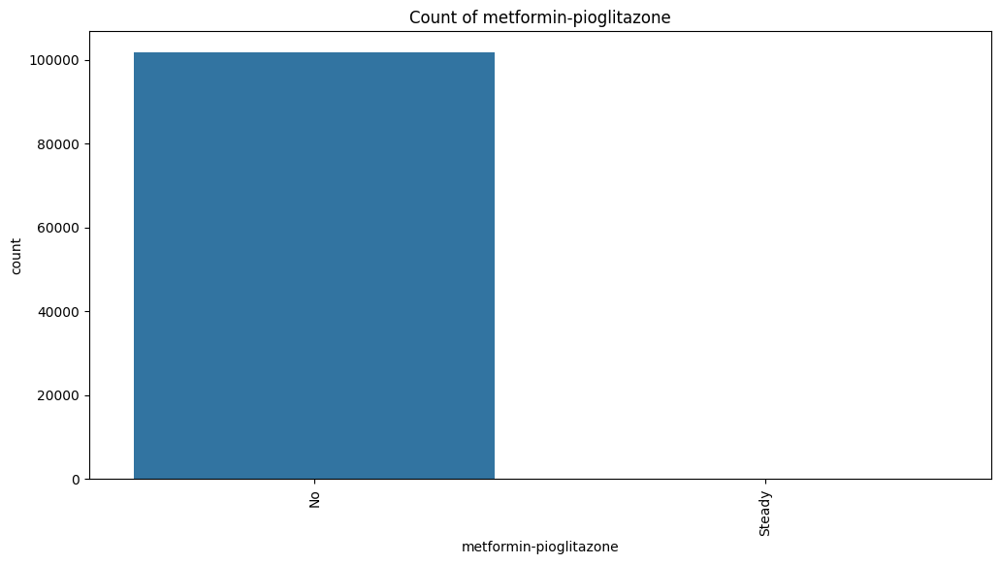

In [ ]:
#Plotting categorical variable, including missing values category
pie_chart_columns = [
    'gender', 'readmitted', 'change', 'diabetesMed',
    'max_glu_serum', 'A1Cresult', 'examide',
    'citoglipton', 'insulin', 'metformin'
]

# Plotting pie charts
for col in pie_chart_columns:
    plt.figure(figsize=(8, 8))
    df[col].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title(f'Distribution of {col}')
    plt.ylabel('')
    plt.show()

bar_chart_columns = [
    'race', 'age', 'weight', 'payer_code', 'medical_specialty',
    'diag_1', 'diag_2', 'diag_3', 'repaglinide', 'nateglinide',
    'chlorpropamide', 'glimepiride', 'acetohexamide', 'glipizide',
    'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone',
    'acarbose', 'miglitol', 'troglitazone', 'tolazamide',
    'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone',
    'metformin-rosiglitazone', 'metformin-pioglitazone'
]

# Plotting bar charts
for col in bar_chart_columns:
    plt.figure(figsize=(12, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Count of {col}')
    plt.xticks(rotation=90)
    plt.show()

In [ ]:
# converting numeric columns to numeric data types and categorical columns to category data type
for col in numeric_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

for col in categorical_columns:
    if col in df.columns:
        df[col] = df[col].astype('category')
print(df.dtypes)
print(df[numeric_columns].dtypes)


encounter_id                   int64
patient_nbr                    int64
race                        category
gender                      category
age                         category
weight                      category
admission_type_id              int64
discharge_disposition_id       int64
admission_source_id            int64
time_in_hospital               int64
payer_code                  category
medical_specialty           category
num_lab_procedures             int64
num_procedures                 int64
num_medications                int64
number_outpatient              int64
number_emergency               int64
number_inpatient               int64
diag_1                      category
diag_2                      category
diag_3                      category
number_diagnoses               int64
max_glu_serum               category
A1Cresult                   category
metformin                   category
repaglinide                 category
nateglinide                 category
c

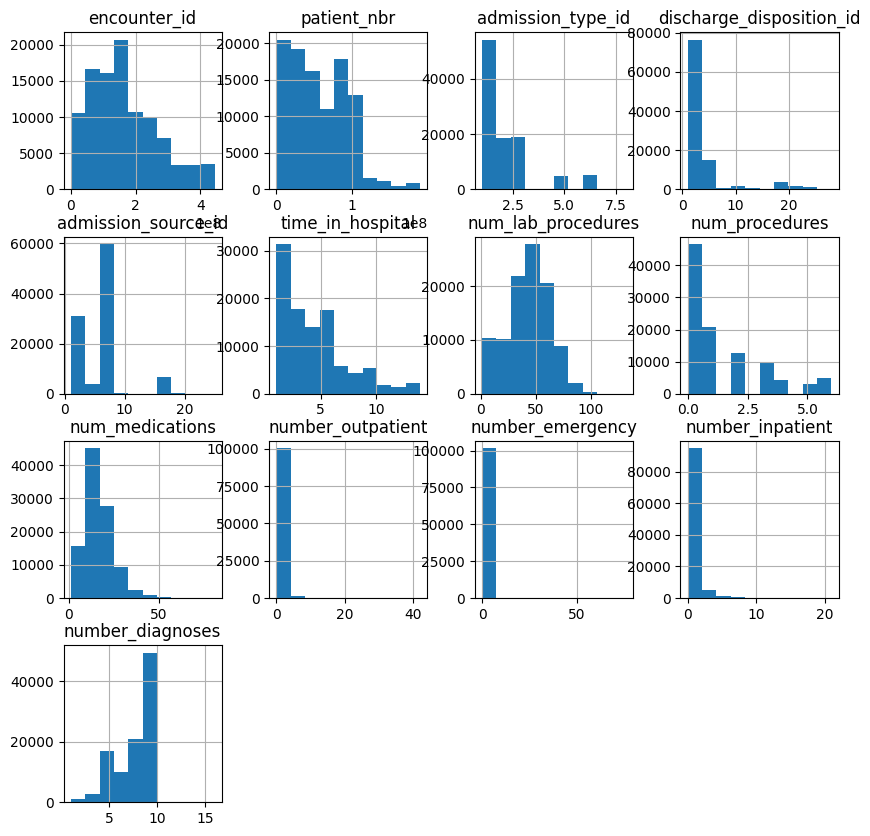

In [ ]:
#Visualizing the distribution of the numeric variables
df[numeric_columns].hist(figsize=(10, 10))
plt.show()

In [ ]:
# Check for missing values
missing_values = df.isnull().sum()
print(missing_values)

encounter_id                0
patient_nbr                 0
race                        0
gender                      0
age                         0
weight                      0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
payer_code                  0
medical_specialty           0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazo

In [ ]:
#Checking for duplicate records
duplicate_records = df.duplicated().sum()
print(f"Number of duplicate records: {duplicate_records}")

Number of duplicate records: 0


In [ ]:
# Panda profiling report
import ydata_profiling
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="YData Profiling Report", explorative=True)
profile.to_notebook_iframe()
profile.to_file("ydata_profiling_report.html")
files.download("ydata_profiling_report.html")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

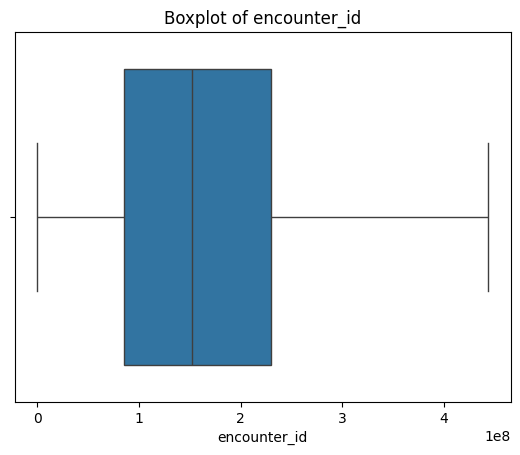

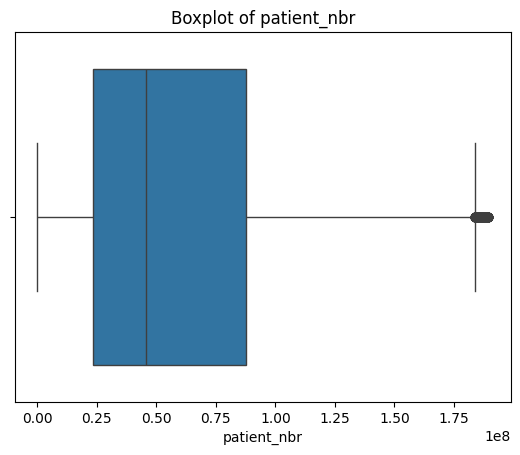

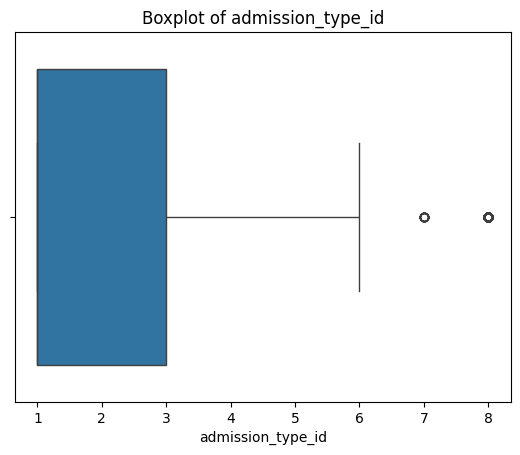

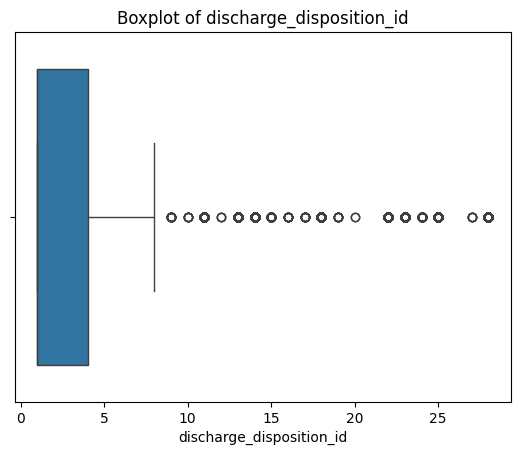

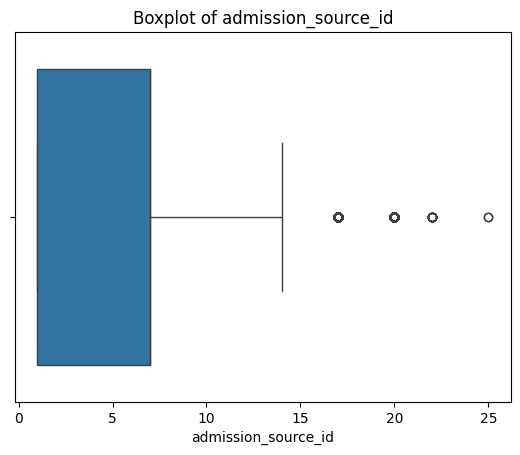

...

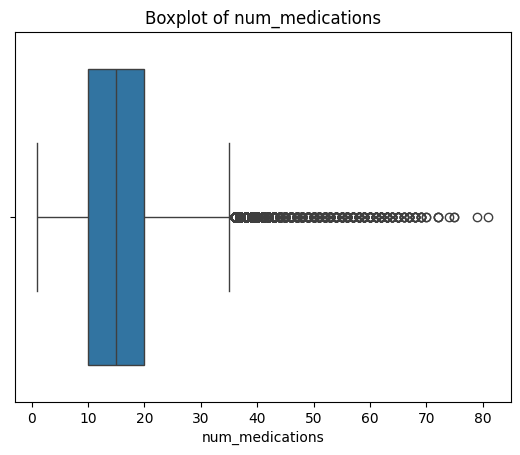

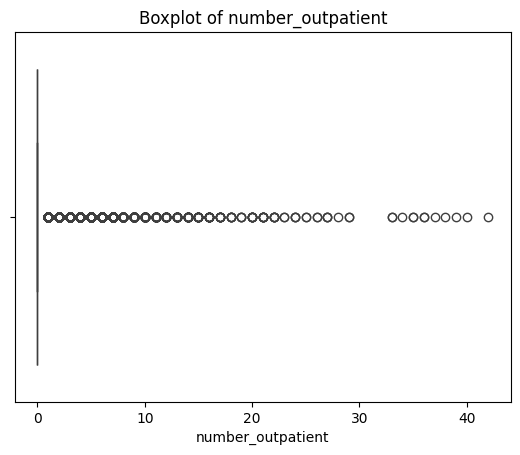

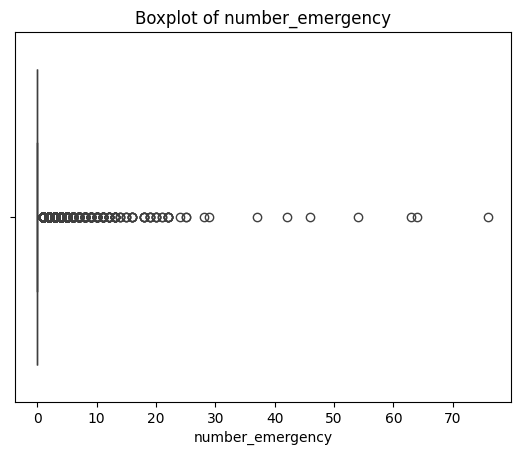

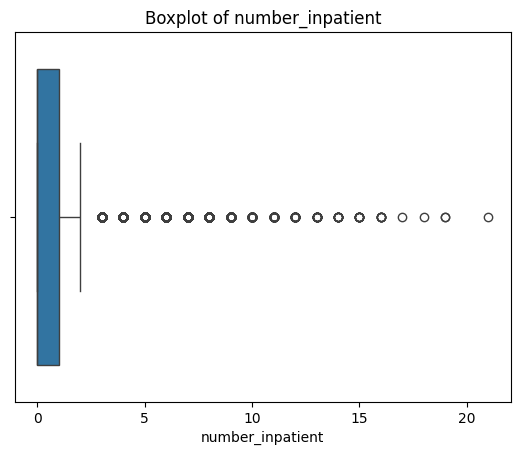

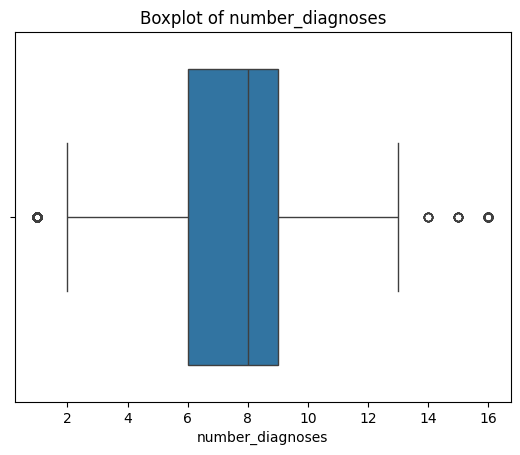

In [ ]:
#Identifying outliers visually in numeric columns using boxplots
for col in numeric_columns:
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()


In [ ]:
#Identifying outliers in numeric columns
#Function to calculate and print outliers
def outliers(df, numeric_columns):
    outliers_count = {}

    for col in numeric_columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        outliers_count[col] = outliers[col]

        print(f"{col}:")
        print(f"  Q1: {Q1}")
        print(f"  Q3: {Q3}")
        print(f"  IQR: {IQR}")
        print(f"  Lower Bound: {lower_bound}")
        print(f"  Upper Bound: {upper_bound}")
        print(f"  Outliers: {len(outliers)}")
        print()

    return outliers_count

#print outliers
outliers_count = outliers(df, numeric_columns)

encounter_id:
  Q1: 84961194.0
  Q3: 230270887.5
  IQR: 145309693.5
  Lower Bound: -133003346.25
  Upper Bound: 448235427.75
  Outliers: 0

patient_nbr:
  Q1: 23413221.0
  Q3: 87545949.75
  IQR: 64132728.75
  Lower Bound: -72785872.125
  Upper Bound: 183745042.875
  Outliers: 247

admission_type_id:
  Q1: 1.0
  Q3: 3.0
  IQR: 2.0
  Lower Bound: -2.0
  Upper Bound: 6.0
  Outliers: 341

discharge_disposition_id:
  Q1: 1.0
  Q3: 4.0
  IQR: 3.0
  Lower Bound: -3.5
  Upper Bound: 8.5
  Outliers: 9818

admission_source_id:
  Q1: 1.0
  Q3: 7.0
  IQR: 6.0
  Lower Bound: -8.0
  Upper Bound: 16.0
  Outliers: 6956

time_in_hospital:
  Q1: 2.0
  Q3: 6.0
  IQR: 4.0
  Lower Bound: -4.0
  Upper Bound: 12.0
  Outliers: 2252

num_lab_procedures:
  Q1: 31.0
  Q3: 57.0
  IQR: 26.0
  Lower Bound: -8.0
  Upper Bound: 96.0
  Outliers: 143

num_procedures:
  Q1: 0.0
  Q3: 2.0
  IQR: 2.0
  Lower Bound: -3.0
  Upper Bound: 5.0
  Outliers: 4954

num_medications:
  Q1: 10.0
  Q3: 20.0
  IQR: 10.0
  Lower Bound: 

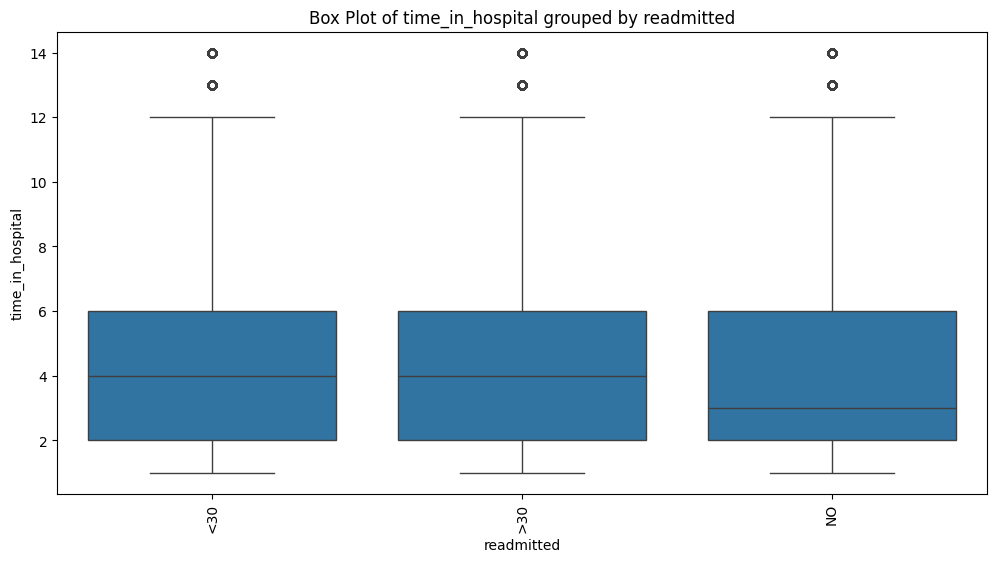

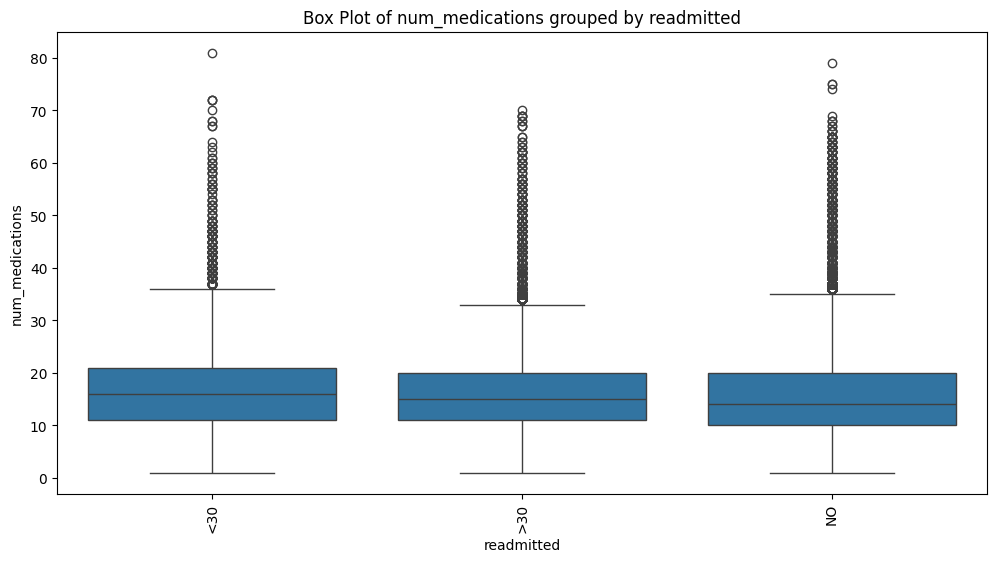

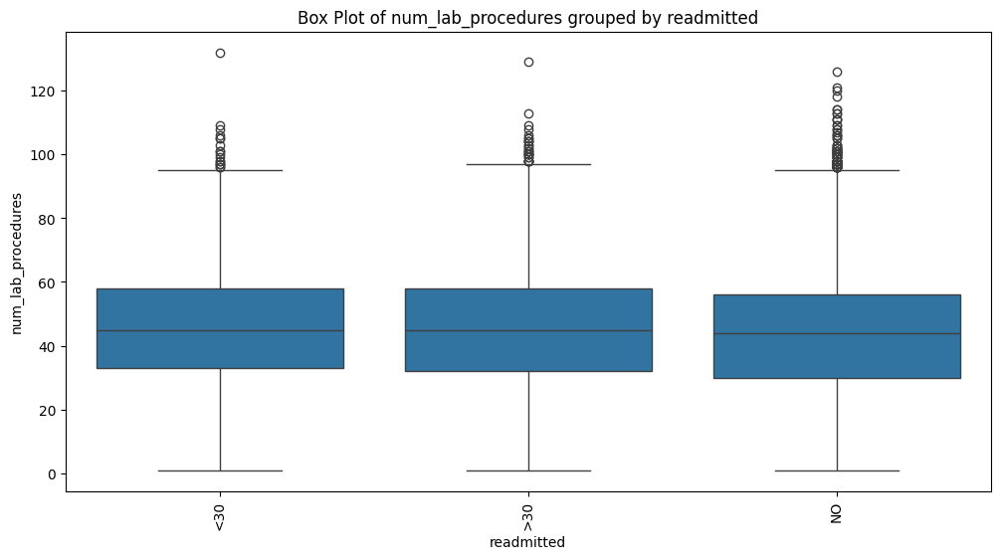

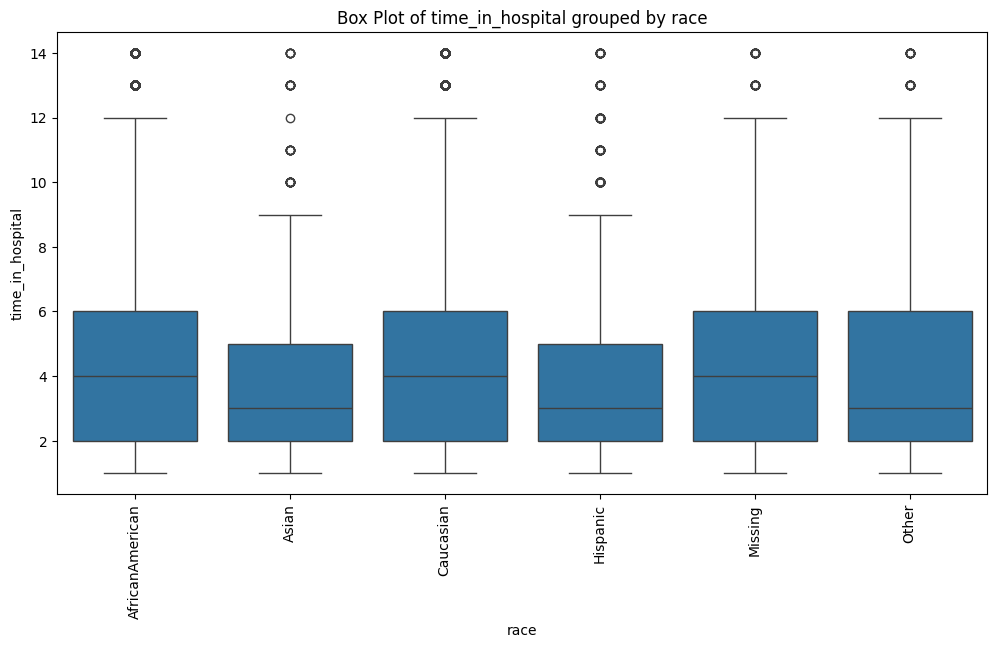

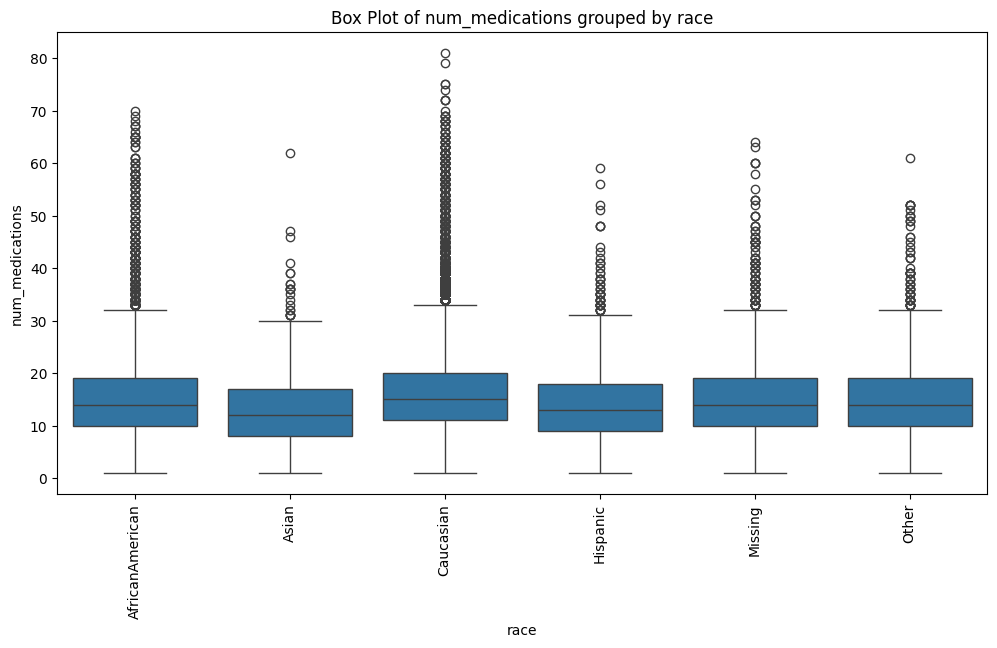

...

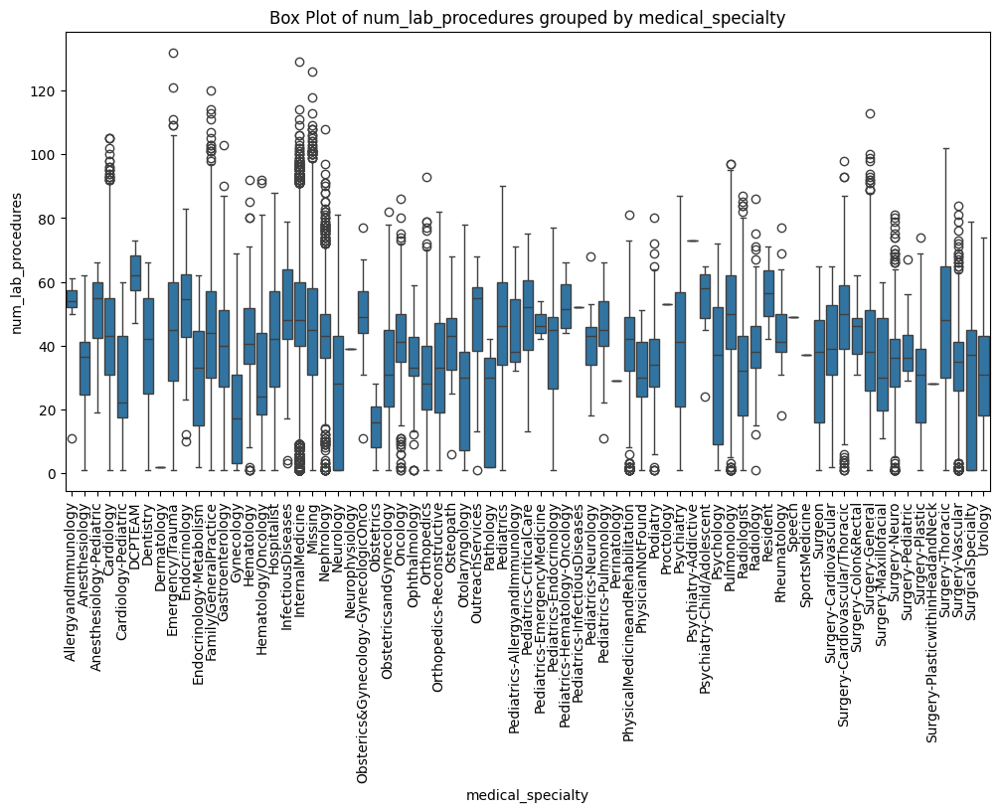

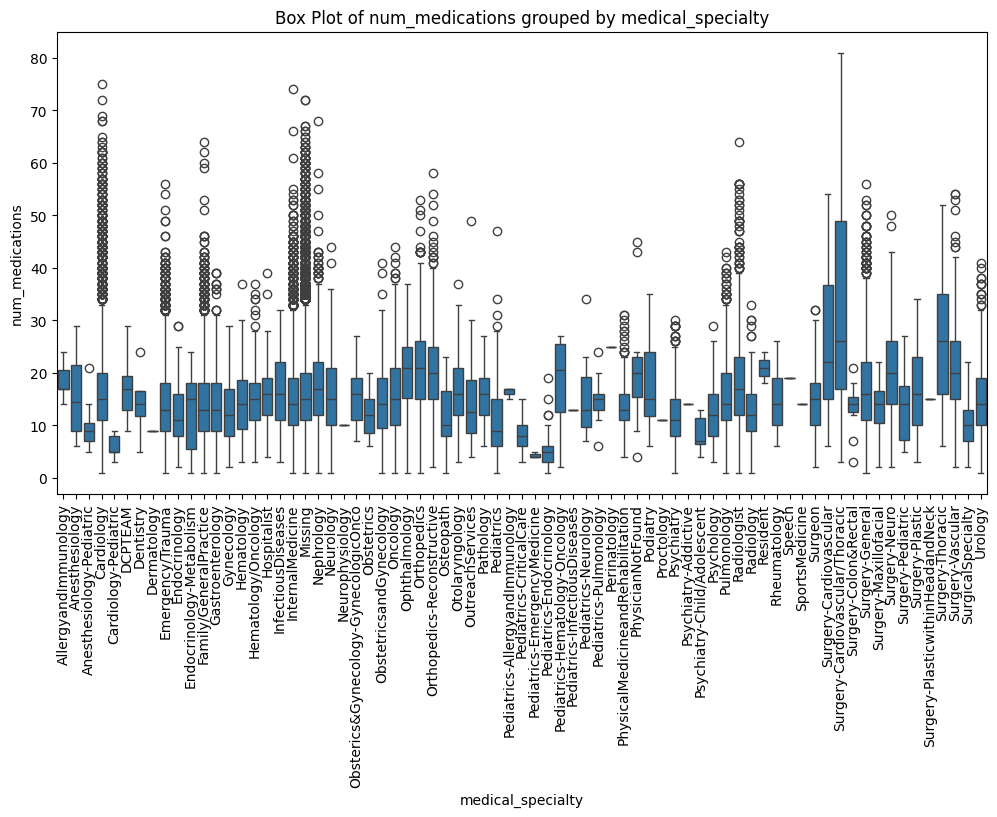

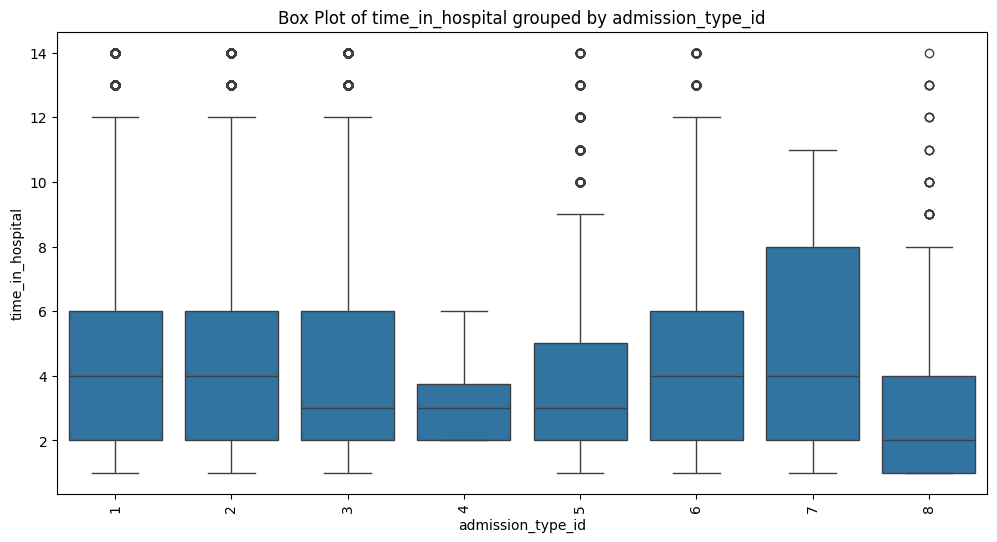

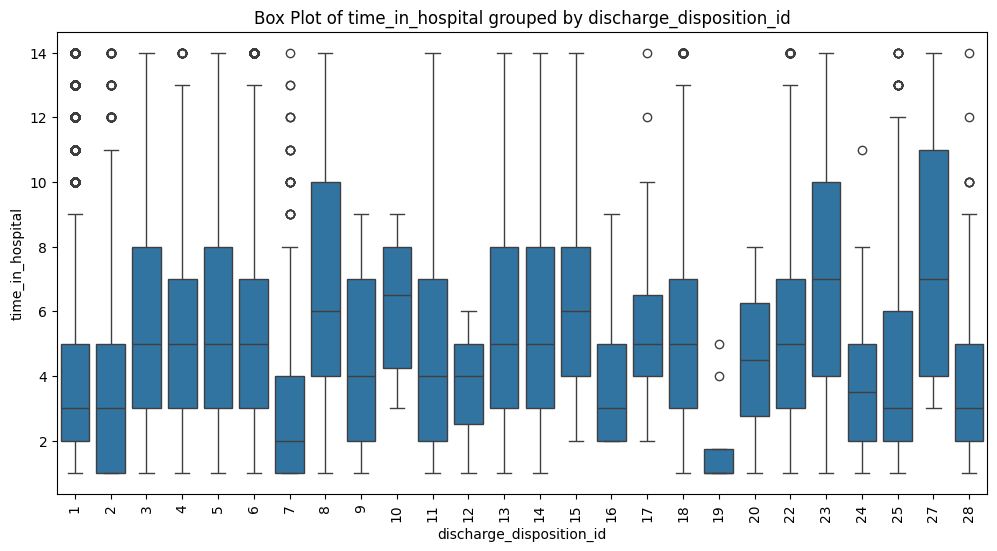

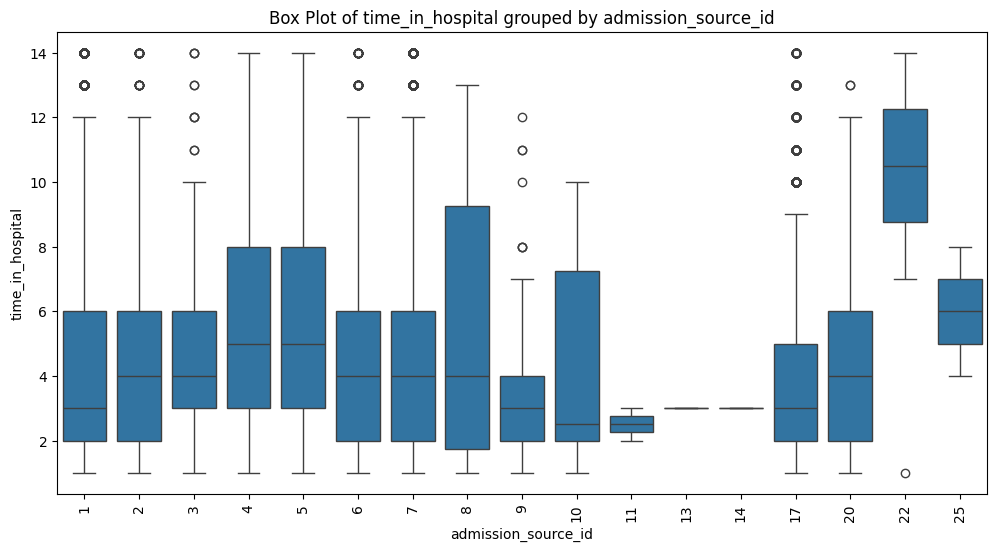

In [ ]:
# Visualizing outliers for selected important combinations
important_combinations = [
    ('readmitted', 'time_in_hospital'),
    ('readmitted', 'num_medications'),
    ('readmitted', 'num_lab_procedures'),
    ('race', 'time_in_hospital'),
    ('race', 'num_medications'),
    ('gender', 'time_in_hospital'),
    ('gender', 'num_medications'),
    ('age', 'time_in_hospital'),
    ('age', 'num_medications'),
    ('medical_specialty', 'time_in_hospital'),
    ('medical_specialty', 'num_lab_procedures'),
    ('medical_specialty', 'num_medications'),
    ('admission_type_id', 'time_in_hospital'),
    ('discharge_disposition_id', 'time_in_hospital'),
    ('admission_source_id', 'time_in_hospital')
]

for categorical_col, numeric_col in important_combinations:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x=categorical_col, y=numeric_col, data=df)
    plt.title(f'Box Plot of {numeric_col} grouped by {categorical_col}')
    plt.xticks(rotation=90)
    plt.show()


In [ ]:
# Here I wanted to clean the dataframe by removing irrelevant columns, columns with high missing values
df_cleaned = df.copy()
columns_to_drop = ['encounter_id', 'patient_nbr', 'weight', 'payer_code']
df_cleaned.drop(columns=columns_to_drop, inplace=True)

# Here I put a threshold of 95% for List of columns dominated by "No" category since they have very low variance and no added value
columns_dominated_by_no = [
    'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
    'glimepiride', 'acetohexamide', 'glipizide', 'glyburide',
    'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose',
    'troglitazone', 'tolazamide', 'examide', 'citoglipton',
    'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone',
    'metformin-rosiglitazone', 'metformin-pioglitazone'
]

threshold = 0.95
columns_to_drop_dominated = []
for col in columns_dominated_by_no:
    if df_cleaned[col].value_counts(normalize=True).get('No', 0) > threshold:
        columns_to_drop_dominated.append(col)
df_cleaned.drop(columns=columns_to_drop_dominated, inplace=True)

# Check the remaining columns
print("Remaining columns after dropping unnecessary ones:")
print(df_cleaned.columns)
print(df_cleaned.info())

Remaining columns after dropping unnecessary ones:
Index(['race', 'gender', 'age', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'medical_specialty', 'num_lab_procedures', 'num_procedures',
       'num_medications', 'number_outpatient', 'number_emergency',
       'number_inpatient', 'diag_1', 'diag_2', 'diag_3', 'number_diagnoses',
       'max_glu_serum', 'A1Cresult', 'metformin', 'glimepiride', 'glipizide',
       'glyburide', 'pioglitazone', 'rosiglitazone', 'miglitol', 'insulin',
       'change', 'diabetesMed', 'readmitted'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 31 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   race                      101766 non-null  category
 1   gender                    101766 non-null  category
 2   age                       101766 non-nu

In [ ]:
# Identify and verifying remaining categorical columns for onehot coding
categorical_columns = df_cleaned.select_dtypes(include=['category']).columns.tolist()
print("Categorical columns for one-hot encoding:", categorical_columns)


Categorical columns for one-hot encoding: ['race', 'gender', 'age', 'medical_specialty', 'diag_1', 'diag_2', 'diag_3', 'max_glu_serum', 'A1Cresult', 'metformin', 'glimepiride', 'glipizide', 'glyburide', 'pioglitazone', 'rosiglitazone', 'miglitol', 'insulin', 'change', 'diabetesMed', 'readmitted']


In [ ]:
# One-hot encode the remaining categorical columns
df_onehot_coded = pd.get_dummies(df_cleaned, columns=categorical_columns, drop_first=False)
boolean_columns = df_onehot_coded.select_dtypes(include='bool').columns
df_onehot_coded[boolean_columns] = df_onehot_coded[boolean_columns].astype(int)
print(df_onehot_coded.head())
print(df_onehot_coded.columns)


   admission_type_id  discharge_disposition_id  admission_source_id  \
0                  6                        25                    1   
1                  1                         1                    7   
2                  1                         1                    7   
3                  1                         1                    7   
4                  1                         1                    7   

   time_in_hospital  num_lab_procedures  num_procedures  num_medications  \
0                 1                  41               0                1   
1                 3                  59               0               18   
2                 2                  11               5               13   
3                 2                  44               1               16   
4                 1                  51               0                8   

   number_outpatient  number_emergency  number_inpatient  ...  insulin_No  \
0                  0                 0 

In [ ]:
# To assess the normality of the numerical variables, I conducted the Shapiro-Wilk test.
# Despite the test results indicating that none of the variables followed a normal distribution,
# I chose to retain the outliers. The reason behind this decision was that the count of outliers
# across the numeric variables was not substantial, and removing them could potentially reduce
# the variance and valuable information in the dataset.
from scipy.stats import shapiro
dependent_var_columns = ['readmitted_>30', 'readmitted_NO', 'readmitted_<30']
numerical_columns = df_onehot_coded.select_dtypes(include=[np.number]).columns
numerical_columns = numerical_columns.drop(dependent_var_columns)

# Perform the Shapiro-Wilk test
shapiro_results = {}
for col in numerical_columns:
    stat, p_value = shapiro(df_onehot_coded[col])
    shapiro_results[col] = (stat, p_value)
shapiro_df = pd.DataFrame(shapiro_results, index=['Statistic', 'p-value']).T
display(shapiro_df)




/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


,Statistic,p-value
admission_type_id,0.721419,0.0
discharge_disposition_id,0.568973,0.0
admission_source_id,0.737137,0.0
time_in_hospital,0.886919,0.0
num_lab_procedures,0.984858,0.0
...,...,...
insulin_Up,0.363303,0.0
change_Ch,0.634863,0.0
change_No,0.635076,0.0
diabetesMed_No,0.520568,0.0


In [ ]:
#Next step is to normalize the independent variables to insure scalability
# Function to normalize numerical columns
def normalize(x):
    return (x - x.min()) / (x.max() - x.min())
dependent_var_columns = ['readmitted_>30', 'readmitted_NO', 'readmitted_<30']
numerical_columns = df_onehot_coded.select_dtypes(include=[np.number]).columns
numerical_columns = numerical_columns.drop(dependent_var_columns)
for col in numerical_columns:
    df_onehot_coded[col] = normalize(df_onehot_coded[col])
print(df_onehot_coded.head())



   admission_type_id  discharge_disposition_id  admission_source_id  \
0           0.714286                  0.888889                 0.00   
1           0.000000                  0.000000                 0.25   
2           0.000000                  0.000000                 0.25   
3           0.000000                  0.000000                 0.25   
4           0.000000                  0.000000                 0.25   

   time_in_hospital  num_lab_procedures  num_procedures  num_medications  \
0          0.000000            0.305344        0.000000           0.0000   
1          0.153846            0.442748        0.000000           0.2125   
2          0.076923            0.076336        0.833333           0.1500   
3          0.076923            0.328244        0.166667           0.1875   
4          0.000000            0.381679        0.000000           0.0875   

   number_outpatient  number_emergency  number_inpatient  ...  insulin_No  \
0           0.000000               0.0 

In [ ]:
# Checking if the numerical columns are normalized
for col in numerical_columns:
    min_val = df_onehot_coded[col].min()
    max_val = df_onehot_coded[col].max()
    print(f'{col}: min = {min_val}, max = {max_val}')


admission_type_id: min = 0.0, max = 1.0
discharge_disposition_id: min = 0.0, max = 1.0
admission_source_id: min = 0.0, max = 1.0
time_in_hospital: min = 0.0, max = 1.0
num_lab_procedures: min = 0.0, max = 1.0
num_procedures: min = 0.0, max = 1.0
num_medications: min = 0.0, max = 1.0
number_outpatient: min = 0.0, max = 1.0
number_emergency: min = 0.0, max = 1.0
number_inpatient: min = 0.0, max = 1.0
number_diagnoses: min = 0.0, max = 1.0
race_AfricanAmerican: min = 0.0, max = 1.0
race_Asian: min = 0.0, max = 1.0
race_Caucasian: min = 0.0, max = 1.0
race_Hispanic: min = 0.0, max = 1.0
race_Missing: min = 0.0, max = 1.0
race_Other: min = 0.0, max = 1.0
gender_Female: min = 0.0, max = 1.0
gender_Male: min = 0.0, max = 1.0
gender_Unknown/Invalid: min = 0.0, max = 1.0
age_[0-10): min = 0.0, max = 1.0
age_[10-20): min = 0.0, max = 1.0
age_[20-30): min = 0.0, max = 1.0
age_[30-40): min = 0.0, max = 1.0
age_[40-50): min = 0.0, max = 1.0
age_[50-60): min = 0.0, max = 1.0
age_[60-70): min = 0.0, 